Etape 1 : importer les librairies necessaires

In [1]:
import tensorflow as tf
from tensorflow import keras

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

import pathlib
from pathlib import Path
import os

import imghdr
from PIL import Image
import cv2 

import itertools
import datetime

Etape 2 : Préparer l'envirronement de travail

In [2]:
# Use Python version : 3.8.8
# Use Tensorflow version : < 2.11.0
print("Tensorflow version : ", tf.__version__)

Tensorflow version :  2.10.1


In [3]:
def prepare_gpu_acceleration():
    gpus = tf.config.experimental.list_physical_devices('GPU')
    if gpus:
        print("GPU is AVAILABLE 🚀")
        print(tf.config.experimental.list_physical_devices('GPU'))
        try:
            for gpu in gpus:
                tf.config.experimental.set_memory_growth(gpu, True)
        except RuntimeError as e:
            print("An error occured while setting memory growth for GPU 💀")
            print(e)
    else:
        print("GPU is NOT AVAILABLE 🐌")
        print(tf.config.experimental.list_physical_devices())

prepare_gpu_acceleration()

GPU is AVAILABLE 🚀
[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]


Etape 3 : Préparer les données d'entrainement de validation et de test

In [4]:
#definir le chemin vers le répertoire recine du dataset
data_dir = "data"
data_set = pathlib.Path(data_dir)

In [5]:
# Identifier le nombre de fichier dans le dataset
def file_counter():
    counter = {}
    for subdir, dirs, files in os.walk(data_dir):
        # si le repertoire est un répertoire de classe contient des images
        if len(files) > 0:
            # récuperer le nom de la classe
            class_name = os.path.basename(subdir)
            # compter le nombre d'images dans le dictionnaire
            count = len(files)
            # enregistrer le nombre d'images dans le dictionnaire
            counter[class_name] = count

    return counter


counter = file_counter()

print("Nombre de fichiers dans le dataset : ", len(list(data_set.glob('*/*'))))
for class_name, count in counter.items():
    print(f"{class_name} : {count}")


Nombre de fichiers dans le dataset :  19993
Photo : 9993
Text : 10000


In [6]:
# filtrer le dataset , deplacer les images corrumpu

accepted_extensions = [".png", ".jpg", ".jpeg", ".bmp"]

corrupted_images_dir = "corrupted"

# filtrer le dataset , deplacer les images corrumpu
def move_invalid_files(file, subdir):
    if not os.path.exists(corrupted_images_dir):
        os.mkdir(corrupted_images_dir)
    invalid_image_path = os.path.join(corrupted_images_dir, file)
    os.rename(os.path.join(subdir, file), invalid_image_path)


def check_images():
    valid_count = 0
    invalid_count = 0
    count_by_class = {}
    for subdir, dirs, files in os.walk(data_dir):
        # si le repertoire est un répertoire de classe contient des images
        if len(files) > 0:
            for file in files:
                # récuperer le nom de la classe
                class_name = os.path.basename(subdir)
                if class_name not in count_by_class:
                    count_by_class[class_name] = {"valid": 0, "invalid": 0}
                # vérifier si l'extension du fichier est accepté
                if Path(file).suffix.lower() in accepted_extensions:
                    # vérifier si le fichier est une image valide
                    if imghdr.what(os.path.join(subdir, file)) is not None:
                        # check si les images ne sont pas corrompues
                        try:
                            img_bytes = tf.io.read_file(os.path.join(subdir, file))
                            decoded_img = tf.image.decode_image(img_bytes)
                            valid_count += 1
                            count_by_class[class_name]["valid"] += 1
                        except tf.errors.InvalidArgumentError as e:
                            invalid_count += 1
                            count_by_class[class_name]["invalid"] += 1
                            move_invalid_files(file, subdir)
                    else:
                        invalid_count += 1
                        count_by_class[class_name]["invalid"] += 1
                        move_invalid_files(file, subdir)
                else:
                    invalid_count += 1
                    count_by_class[class_name]["invalid"] += 1
                    move_invalid_files(file, subdir)
    return valid_count, invalid_count, count_by_class


# valid_count, invalid_count, count_by_class = check_images()
# print("🟢 valid images: ", valid_count)
# print("🔴 invalid count: ", invalid_count)
# for class_name, count in count_by_class.items():
#     print(class_name)
#     print(f"- {count['valid']} valid")
#     print(f"- {count['invalid']} invalid")


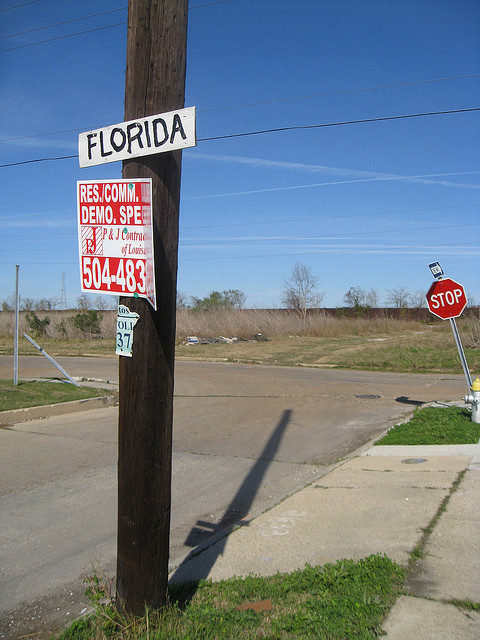

In [7]:
#afficher un echantillons du dataset
painting_images = list(data_set.glob('Photo/*'))
random_painting = np.random.choice(painting_images, 1)
Image.open(str(random_painting[0]))


In [8]:
BATCH_SIZE = 32
IMG_H = 160
IMG_W = 160
SEEDS = 123
VALIDATION_SPLIT = 0.2

In [9]:
# preparer le dataset
 
train_set = tf.keras.utils.image_dataset_from_directory(
    data_set,
    validation_split=VALIDATION_SPLIT,
    subset="training",
    seed=SEEDS,
    image_size=(IMG_H, IMG_W),
    batch_size=BATCH_SIZE,
    shuffle=True
)

val_set = tf.keras.utils.image_dataset_from_directory(
    data_set,
    validation_split=VALIDATION_SPLIT,
    subset="validation",
    seed=SEEDS,
    image_size=(IMG_H, IMG_W),
    batch_size=BATCH_SIZE,
    shuffle=True
)


Found 19993 files belonging to 2 classes.
Using 15995 files for training.
Found 19993 files belonging to 2 classes.
Using 3998 files for validation.


In [10]:
val_batches = tf.data.experimental.cardinality(val_set)
test_set = val_set.take(val_batches // 5)
val_set = val_set.skip(val_batches // 5)

print('Number of validation batches: %d' % tf.data.experimental.cardinality(val_set))
print('Number of test batches: %d' % tf.data.experimental.cardinality(test_set))

Number of validation batches: 100
Number of test batches: 25


In [11]:
# récupérer les noms des classes du dataset
class_names = train_set.class_names
print(f"🎭 Categories : {class_names}")

🎭 Categories : ['Photo', 'Text']


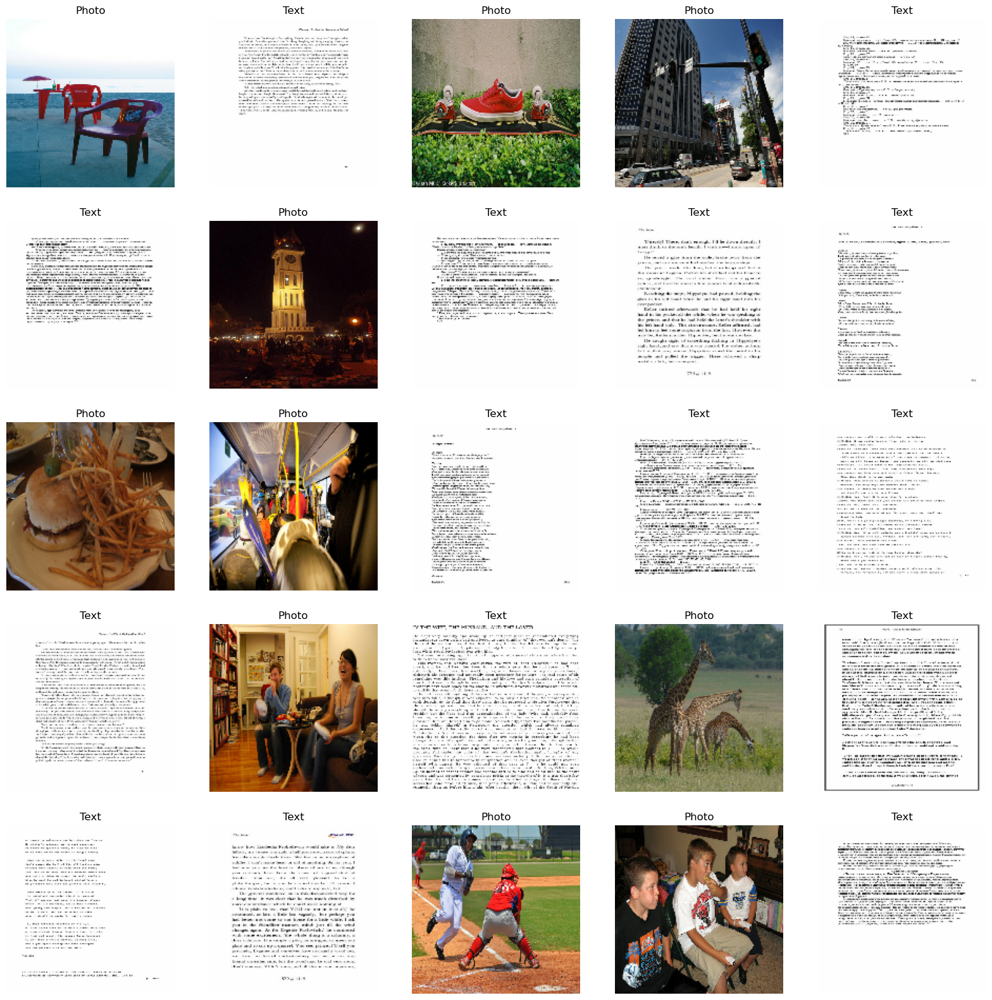

In [12]:
plt.figure(figsize=(20, 20))
for images, labels in train_set.take(1):
  for i in range(25):
    ax = plt.subplot(5, 5, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    plt.axis("off")

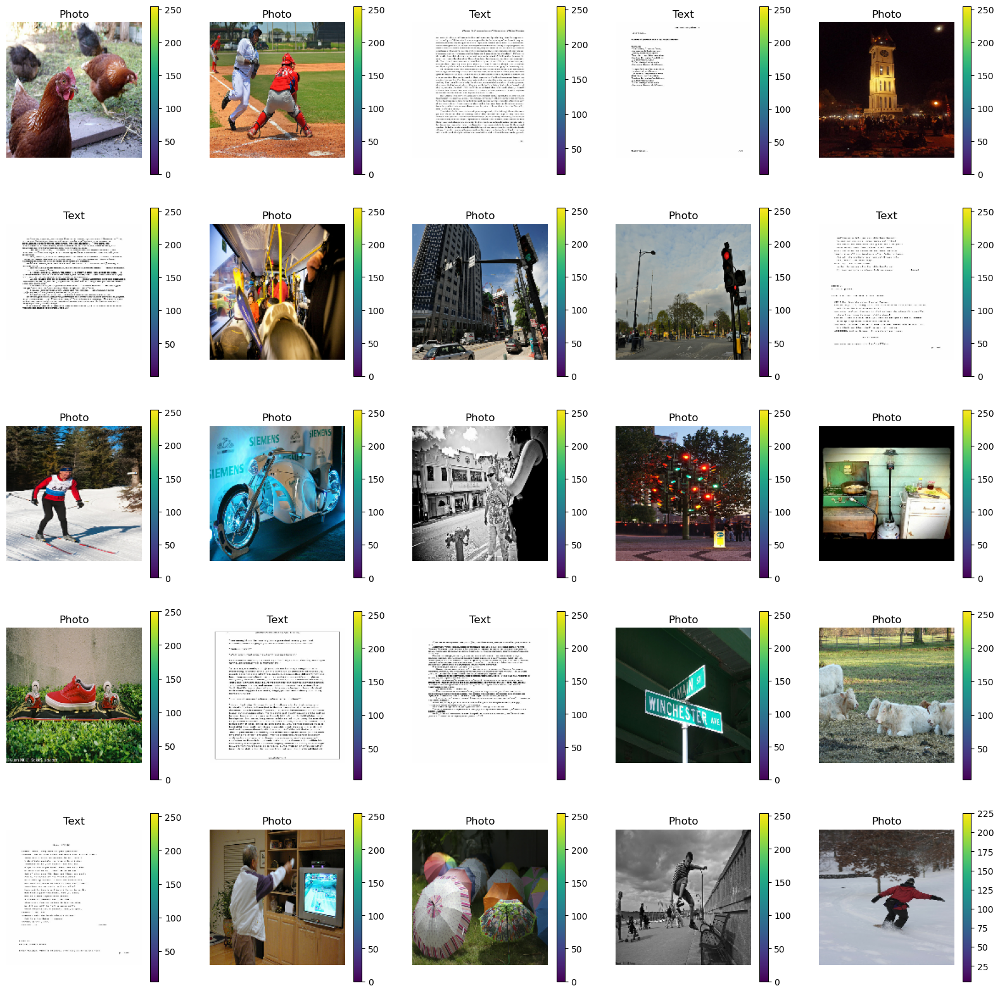

In [13]:
# afficher un echantillon du dataset
plt.figure(figsize=(20, 20))
for images, labels in train_set.take(1):
  for i in range(25):
    ax = plt.subplot(5, 5, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.colorbar()
    plt.title(class_names[labels[i]])
    plt.axis("off")


In [14]:
print(type(train_set))
images , labels = iter(train_set).next()
print(f"🖼️ images shape : {images.shape}")
print(f"🎟️ labels shape{labels.shape}")

<class 'tensorflow.python.data.ops.dataset_ops.BatchDataset'>
🖼️ images shape : (32, 160, 160, 3)
🎟️ labels shape(32,)


In [15]:
image_batch , label_batch = next(iter(train_set))
print(f"🔼 image min : {image_batch.numpy().min()}")
print(f"🔽 image max : {image_batch.numpy().max()}")

🔼 image min : 0.0
🔽 image max : 255.0


In [16]:
NUM_CLASSES = len(class_names)
NO_EPOCHS = 10
SHUFFLE = 1000
RESCALING = 1./127.5
RANDOM_ROTATION = 0.2
RANDOM_ZOOM = 0.1
RANDOM_FILP = "horizontal_and_vertical"
LEARING_RATE = 0.0001
FINE_TUNE_AT = 100 # 100 premières couches du modèle sont entrainées
FINE_TUNE_EPOCHS = 10

In [17]:
# cache conserve les images en mémoire après leur chargement hors disque au cours de la première Epoch
# prefetch chevauche le prétraitement des données et l'exécution du modèle pendant la formation.
# eviter overfitting et augmenter la vitesse d'entrainement du modele
AUTOTUNE = tf.data.AUTOTUNE
train_set = train_set.cache().shuffle(SHUFFLE).prefetch(buffer_size=AUTOTUNE)
val_set = val_set.cache().prefetch(buffer_size=AUTOTUNE)
test_set = test_set.cache().prefetch(buffer_size=AUTOTUNE)


In [18]:
data_augmentation = tf.keras.Sequential([
  tf.keras.layers.RandomFlip(RANDOM_FILP),
  tf.keras.layers.RandomRotation(RANDOM_ROTATION),
  tf.keras.layers.RandomZoom(RANDOM_ZOOM),
])

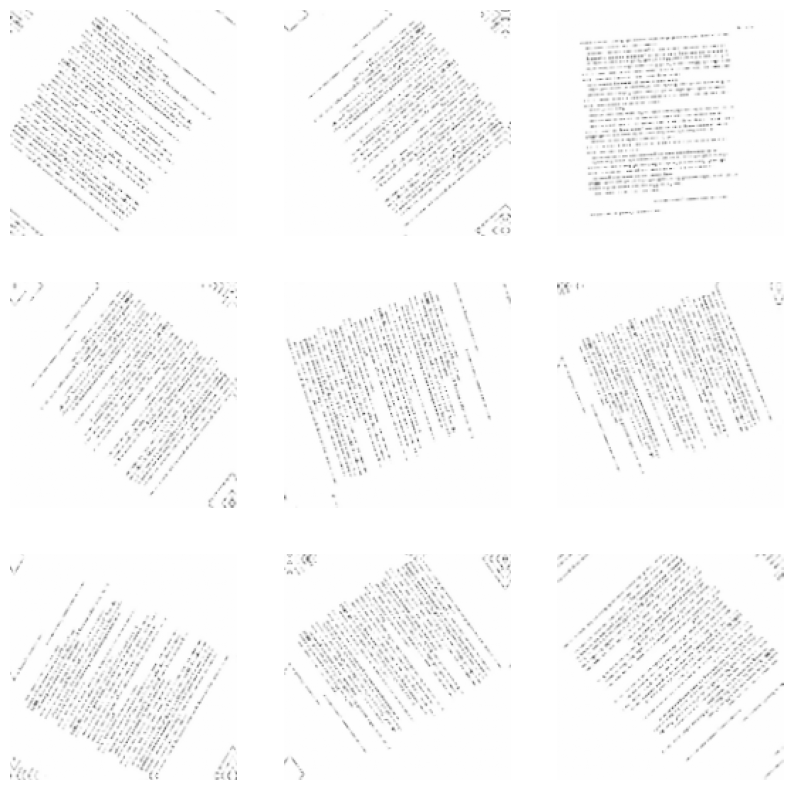

In [19]:
for image, _ in train_set.take(1):
  plt.figure(figsize=(10, 10))
  first_image = image[0]
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    aug_image = data_augmentation(tf.expand_dims(first_image, 0))
    plt.imshow(aug_image[0] / 255)
    plt.axis('off')

In [20]:
preprocess_input = tf.keras.applications.mobilenet_v2.preprocess_input

In [21]:
IMG_SIZE = (IMG_H, IMG_W)
IMG_SHAPE = IMG_SIZE + (3,)

base_model = tf.keras.applications.MobileNetV2(
    input_shape=IMG_SHAPE,
    include_top=False,
    weights="imagenet"
)

In [22]:
image_batch, label_batch = next(iter(train_set))
feature_batch = base_model(image_batch)
print(feature_batch.shape)

(32, 5, 5, 1280)


In [23]:
base_model.trainable = False

In [24]:
base_model.summary()

Model: "mobilenetv2_1.00_160"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 160, 160, 3  0           []                               
                                )]                                                                
                                                                                                  
 Conv1 (Conv2D)                 (None, 80, 80, 32)   864         ['input_1[0][0]']                
                                                                                                  
 bn_Conv1 (BatchNormalization)  (None, 80, 80, 32)   128         ['Conv1[0][0]']                  
                                                                                                  
 Conv1_relu (ReLU)              (None, 80, 80, 32)   0           ['bn_Conv1[0][

In [25]:
global_average_layer = tf.keras.layers.GlobalAveragePooling2D()
feature_batch_average = global_average_layer(feature_batch)
print(feature_batch_average.shape)

(32, 1280)


In [26]:
prediction_layer = tf.keras.layers.Dense(1)
prediction_batch = prediction_layer(feature_batch_average)
print(prediction_batch.shape)

(32, 1)


In [27]:
inputs = tf.keras.Input(shape=(IMG_H, IMG_W, 3))
x = data_augmentation(inputs)
x = preprocess_input(x)
x = base_model(x, training=False)
x = global_average_layer(x)
x = tf.keras.layers.Dropout(0.2)(x)
outputs = prediction_layer(x)
model = tf.keras.Model(inputs, outputs)

In [28]:
# compiler le model optimizer=keras.optimizers.Adam(learning_rate=0.00015)
model.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=LEARING_RATE),
    loss=tf.keras.losses.BinaryCrossentropy(from_logits=True),
    metrics=['accuracy'])


In [29]:
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 160, 160, 3)]     0         
                                                                 
 sequential (Sequential)     (None, 160, 160, 3)       0         
                                                                 
 tf.math.truediv (TFOpLambda  (None, 160, 160, 3)      0         
 )                                                               
                                                                 
 tf.math.subtract (TFOpLambd  (None, 160, 160, 3)      0         
 a)                                                              
                                                                 
 mobilenetv2_1.00_160 (Funct  (None, 5, 5, 1280)       2257984   
 ional)                                                          
                                                             

In [30]:
len(model.trainable_variables)

2

In [31]:
# Definition de la validation croisée
models_dir = 'models/' + datetime.datetime.now().strftime("%Y%m%d-%H%M%S") + '/' + 'model.h5'
logs_dir = "logs/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")


In [32]:
callbacks = [
    tf.keras.callbacks.TensorBoard(log_dir=logs_dir , histogram_freq=1),
    tf.keras.callbacks.ModelCheckpoint(models_dir, verbose=1, save_best_only=True),
    tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5, verbose=1, mode='auto') , 
]

In [33]:
hist = model.fit(
    train_set,
    epochs=NO_EPOCHS,
    validation_data=val_set,
    verbose=1,
    callbacks=callbacks
)

Epoch 1/10
500/500 [==============================] - ETA: 0s - loss: 0.1930 - accuracy: 0.9156
Epoch 1: val_loss improved from inf to 0.08259, saving model to models/20221230-131649\model.h5
500/500 [==============================] - 128s 246ms/step - loss: 0.1930 - accuracy: 0.9156 - val_loss: 0.0826 - val_accuracy: 0.9919
Epoch 2/10
500/500 [==============================] - ETA: 0s - loss: 0.0292 - accuracy: 0.9939
Epoch 2: val_loss improved from 0.08259 to 0.03555, saving model to models/20221230-131649\model.h5
500/500 [==============================] - 117s 234ms/step - loss: 0.0292 - accuracy: 0.9939 - val_loss: 0.0355 - val_accuracy: 0.9994
Epoch 3/10
500/500 [==============================] - ETA: 0s - loss: 0.0142 - accuracy: 0.9973
Epoch 3: val_loss improved from 0.03555 to 0.02021, saving model to models/20221230-131649\model.h5
500/500 [==============================] - 117s 234ms/step - loss: 0.0142 - accuracy: 0.9973 - val_loss: 0.0202 - val_accuracy: 1.0000
Epoch 4/10


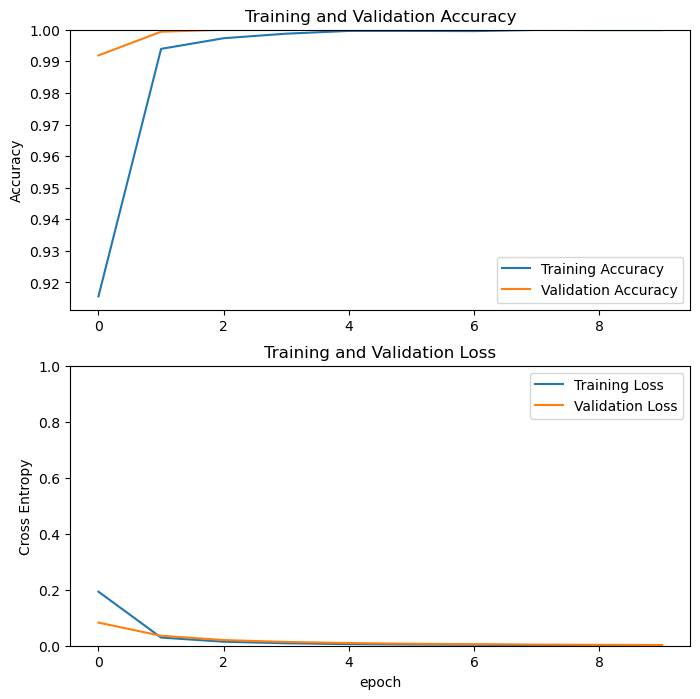

In [34]:
acc = hist.history['accuracy']
val_acc = hist.history['val_accuracy']

loss = hist.history['loss']
val_loss = hist.history['val_loss']

plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.legend(loc='lower right')
plt.ylabel('Accuracy')
plt.ylim([min(plt.ylim()),1])
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.legend(loc='upper right')
plt.ylabel('Cross Entropy')
plt.ylim([0,1.0])
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

In [35]:
loss, acc = model.evaluate(val_set, verbose=1)

print("initial loss: {:.2f}".format(loss))
print("initial accuracy: {:.2f}".format(acc))

100/100 [==============================] - 2s 18ms/step - loss: 0.0026 - accuracy: 1.0000
initial loss: 0.00
initial accuracy: 1.00


In [36]:
base_model.trainable = True

In [37]:
# Let's take a look to see how many layers are in the base model
print("Nombre de couches dans le model MobileNet: ", len(base_model.layers))


# Freeze all the layers before the `fine_tune_at` layer
for layer in base_model.layers[:FINE_TUNE_AT]:
  layer.trainable = False

Nombre de couches dans le model MobileNet:  154


In [38]:
model.compile(loss=tf.keras.losses.BinaryCrossentropy(from_logits=True),
              optimizer = tf.keras.optimizers.RMSprop(learning_rate=LEARING_RATE/10),
              metrics=['accuracy'])

In [39]:
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 160, 160, 3)]     0         
                                                                 
 sequential (Sequential)     (None, 160, 160, 3)       0         
                                                                 
 tf.math.truediv (TFOpLambda  (None, 160, 160, 3)      0         
 )                                                               
                                                                 
 tf.math.subtract (TFOpLambd  (None, 160, 160, 3)      0         
 a)                                                              
                                                                 
 mobilenetv2_1.00_160 (Funct  (None, 5, 5, 1280)       2257984   
 ional)                                                          
                                                             

In [40]:
len(model.trainable_variables)

56

In [41]:
total_epochs =  NO_EPOCHS + FINE_TUNE_EPOCHS
hist_fine = model.fit(
    train_set,
    epochs=total_epochs,
    initial_epoch=hist.epoch[-1],
    validation_data=val_set,
    verbose=1,
    callbacks=callbacks
)

Epoch 10/20
500/500 [==============================] - ETA: 0s - loss: 1.1744e-04 - accuracy: 1.0000
Epoch 10: val_loss improved from 0.00258 to 0.00000, saving model to models/20221230-131649\model.h5
500/500 [==============================] - 131s 247ms/step - loss: 1.1744e-04 - accuracy: 1.0000 - val_loss: 6.0120e-07 - val_accuracy: 1.0000
Epoch 11/20
500/500 [==============================] - ETA: 0s - loss: 9.8762e-07 - accuracy: 1.0000
Epoch 11: val_loss improved from 0.00000 to 0.00000, saving model to models/20221230-131649\model.h5
500/500 [==============================] - 123s 247ms/step - loss: 9.8762e-07 - accuracy: 1.0000 - val_loss: 1.7140e-08 - val_accuracy: 1.0000
Epoch 12/20
500/500 [==============================] - ETA: 0s - loss: 8.2581e-06 - accuracy: 1.0000
Epoch 12: val_loss improved from 0.00000 to 0.00000, saving model to models/20221230-131649\model.h5
500/500 [==============================] - 126s 252ms/step - loss: 8.2581e-06 - accuracy: 1.0000 - val_loss:

In [42]:
acc = hist_fine.history['accuracy']
val_acc = hist_fine.history['val_accuracy']

loss = hist_fine.history['loss']
val_loss = hist_fine.history['val_loss']

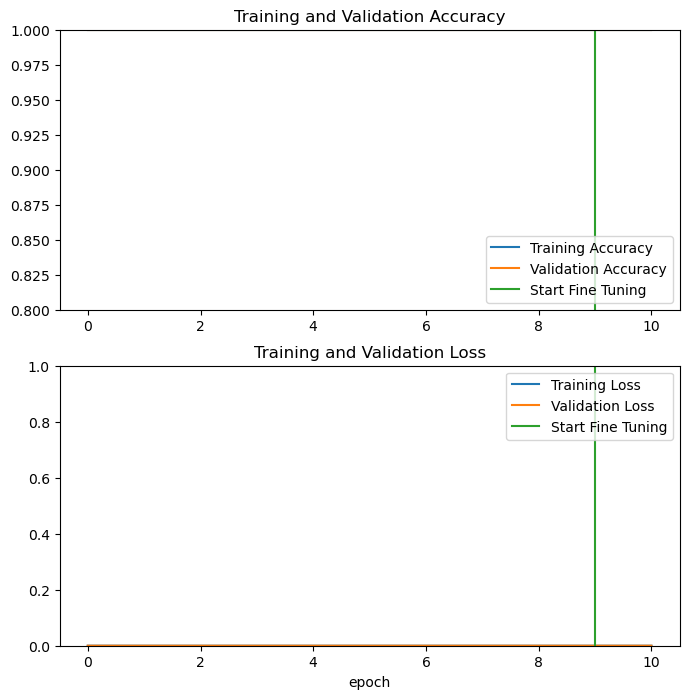

In [43]:
plt.figure(figsize=(8, 8))
plt.subplot(2, 1, 1)
plt.plot(acc, label='Training Accuracy')
plt.plot(val_acc, label='Validation Accuracy')
plt.ylim([0.8, 1])
plt.plot([NO_EPOCHS-1,NO_EPOCHS-1],
          plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

plt.subplot(2, 1, 2)
plt.plot(loss, label='Training Loss')
plt.plot(val_loss, label='Validation Loss')
plt.ylim([0, 1.0])
plt.plot([NO_EPOCHS-1,NO_EPOCHS-1],
         plt.ylim(), label='Start Fine Tuning')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')
plt.xlabel('epoch')
plt.show()

In [44]:
loss, accuracy = model.evaluate(test_set, verbose=1)
print('Test accuracy :', accuracy)
print('Test loss :', loss)

25/25 [==============================] - 1s 25ms/step - loss: 1.3685e-10 - accuracy: 1.0000
Test accuracy : 1.0
Test loss : 1.368496704845512e-10


Predictions:
 [1 1 1 1 1 1 0 0 1 0 0 1 1 1 0 1 1 1 1 0 0 0 1 1 1 0 1 0 1 0 0 0]
Labels:
 [1 1 1 1 1 1 0 0 1 0 0 1 1 1 0 1 1 1 1 0 0 0 1 1 1 0 1 0 1 0 0 0]


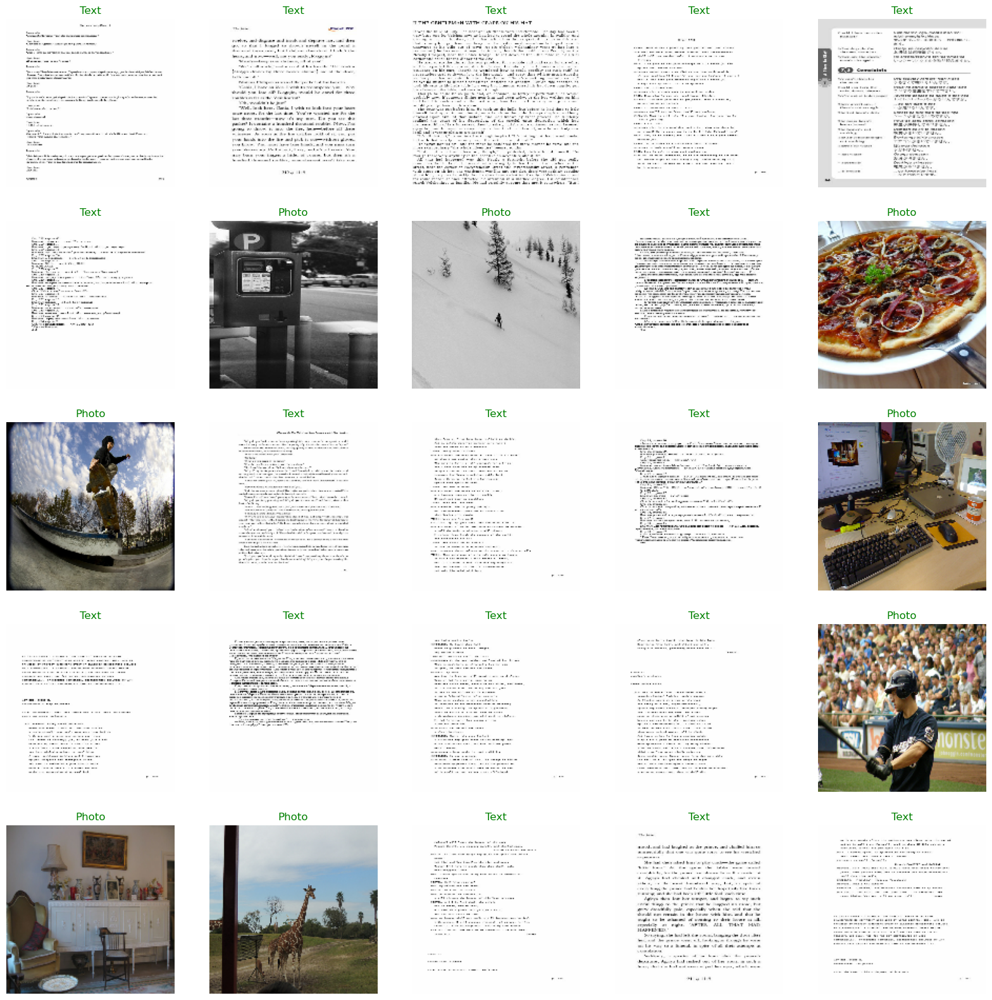

In [45]:
# Retrieve a batch of images from the test set
image_batch, label_batch = test_set.as_numpy_iterator().next()
predictions = model.predict_on_batch(image_batch).flatten()

# Apply a sigmoid since our model returns logits
predictions = tf.nn.sigmoid(predictions)
predictions = tf.where(predictions < 0.5, 0, 1)

print('Predictions:\n', predictions.numpy())
print('Labels:\n', label_batch)

plt.figure(figsize=(20, 20))
for i in range(25):
    ax = plt.subplot(5, 5, i + 1)
    plt.imshow(image_batch[i].astype("uint8"))
    plt.title(f"{class_names[predictions[i]]}", color=("green" if predictions[i] == label_batch[i] else "red"))
    plt.axis("off")

In [46]:
# load the best model
best_model = tf.keras.models.load_model(models_dir)

# Evaluate the model on the test data using `evaluate`
print("Evaluate on test data")
results = best_model.evaluate(test_set, batch_size=128)
print("test loss, test acc:", results)

Evaluate on test data
25/25 [==============================] - 1s 22ms/step - loss: 1.3685e-10 - accuracy: 1.0000
test loss, test acc: [1.368496704845512e-10, 1.0]


Predictions:
 [1 1 1 1 1 1 0 0 1 0 0 1 1 1 0 1 1 1 1 0 0 0 1 1 1 0 1 0 1 0 0 0]
Labels:
 [1 1 1 1 1 1 0 0 1 0 0 1 1 1 0 1 1 1 1 0 0 0 1 1 1 0 1 0 1 0 0 0]


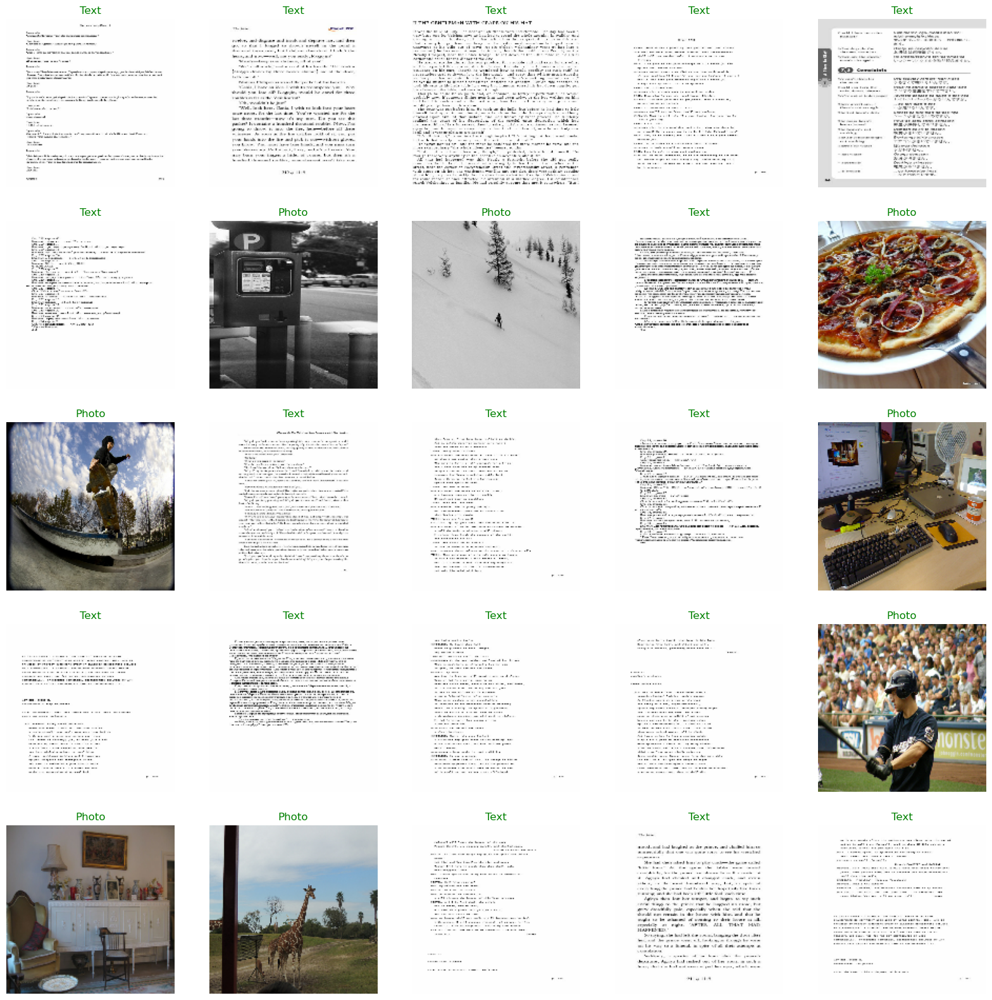

In [47]:
# Retrieve a batch of images from the test set
image_batch, label_batch = test_set.as_numpy_iterator().next()
predictions = best_model.predict_on_batch(image_batch).flatten()

# Apply a sigmoid since our model returns logits
predictions = tf.nn.sigmoid(predictions)
predictions = tf.where(predictions < 0.5, 0, 1)

print('Predictions:\n', predictions.numpy())
print('Labels:\n', label_batch)

plt.figure(figsize=(20, 20))
for i in range(25):
    ax = plt.subplot(5, 5, i + 1)
    plt.imshow(image_batch[i].astype("uint8"))
    plt.title(f"{class_names[predictions[i]]}", color=("green" if predictions[i] == label_batch[i] else "red"))
    plt.axis("off")